# Nettverksanalyse i sgis
https://github.com/statisticsnorway/ssb-sgis

Notebook-en kan kjøres i dapla hvis man har tilgang til bøtta 'kart'.

Eller åpnes her: https://nbviewer.org/github/statisticsnorway/intro_til_geopandas/blob/main/nettverksanalyse_lang.ipynb

Innhold:
- Klargjøre vegdata for nettverksanalyse
- get_route_frequency: Tell opp antall ganger hver veg blir brukt
- service_area: Finn området som kan nås innen gitte reisetider
- od_cost_matrix: Rask beregning av reisetid fra start- til sluttpunkter
- get_route: Finn raskeste rute(r) fra A til B

In [1]:
# for å installere, kjør i terminalen:
# poetry add ssb-sgis

In [2]:
import numpy as np
import sgis as sg

## Hente vegdata

Henter vegdata i Oslo for 2022.

Dataene kan leses direkte herfra:

In [3]:
url = "https://media.githubusercontent.com/media/statisticsnorway/ssb-sgis/main/tests/testdata/roads_oslo_2022.parquet"
veger = sg.read_parquet_url(url)
veger

,linkid,fromnode,tonode,streetname,fromangle,toangle,formofway,funcroadclass,routeid,from_measure,...,estimateddrivetimetruck_bw,drivetimetourist_fw,drivetimetourist_bw,drivetimebus_fw,drivetimebus_bw,estimateddrivetimebus_fw,estimateddrivetimebus_bw,lengde,SHAPE_Length,geometry
119702,121690,135529,135537,skogsbilsveg,203,187,1,7,1058193,0.972103,...,0.188357,0.216611,0.216611,0.216611,0.216611,0.188357,0.188357,NaN,36.838554,MULTILINESTRING Z ((258028.440 6674249.890 413...
199710,203624,223290,223291,Rv163,107,107,2,2,1209419,0.000000,...,-1.000000,0.099323,-1.000000,0.099323,-1.000000,0.086368,-1.000000,NaN,110.359439,MULTILINESTRING Z ((271778.700 6653238.900 138...
199725,203640,223291,223306,Rv163,107,107,2,2,1209420,0.000000,...,-1.000000,0.173963,-1.000000,0.173963,-1.000000,0.151272,-1.000000,NaN,193.291970,MULTILINESTRING Z ((271884.510 6653207.540 142...
199726,203641,223291,223307,Rv163,85,85,2,2,1209421,0.000000,...,-1.000000,0.011827,-1.000000,0.011827,-1.000000,0.010284,-1.000000,NaN,13.141298,MULTILINESTRING Z ((271884.510 6653207.540 142...
199733,203648,223313,223291,Rv163,135,135,2,2,1209423,0.000000,...,-1.000000,0.009097,-1.000000,0.009097,-1.000000,0.007910,-1.000000,NaN,10.107394,MULTILINESTRING Z ((271877.373 6653214.697 141...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1944129,2137454,1836098,1836031,Rv191,74,74,5,2,1830201,0.919438,...,-1.000000,0.010482,-1.000000,0.010482,-1.000000,0.027344,-1.000000,NaN,8.735034,MULTILINESTRING Z ((268649.503 6651869.320 111...
1944392,2137723,575129,1836232,Bygdøynesveien,333,333,1,7,3165154,0.000000,...,0.117879,0.135561,0.135561,0.135561,0.135561,0.117879,0.117879,NaN,46.109289,MULTILINESTRING Z ((259501.570 6648459.580 3.2...
1944398,2137729,1836234,1836235,Fredriksborgveien,183,183,1,7,3165155,0.000000,...,0.059338,0.068239,0.068239,0.068239,0.068239,0.059338,0.059338,NaN,23.210556,MULTILINESTRING Z ((258292.600 6648313.440 18....
1944409,2137741,1836240,1481147,Fredriksborgveien,178,178,1,7,3165155,0.750896,...,0.020547,0.023629,0.023629,0.023629,0.023629,0.020547,0.020547,NaN,8.036981,MULTILINESTRING Z ((258291.452 6648289.258 19....


Eller herfra, hvis man har tilgang til kart-bøtta:

In [4]:
kartdata = "ssb-prod-kart-data-delt/kartdata_analyse/klargjorte-data"

veger = (
    sg.read_geopandas(
        f"{kartdata}/2022/NVDB_ruteplan_nettverk_p20220703_v1.parquet",
        filters=[("KOMMUNENR", "in",  ("0301", "3024", "3020"))],
        columns=["oneway", "drivetime_fw", "drivetime_bw", "geometry"]
    )
    .sort_values("oneway")
    .reset_index(drop=True)
)

veger

,oneway,drivetime_fw,drivetime_bw,geometry
0,B,0.216611,0.216611,MULTILINESTRING Z ((258028.440 6674249.890 413...
1,B,0.062602,0.062602,MULTILINESTRING Z ((265347.560 6654750.570 230...
2,B,0.053945,0.053945,MULTILINESTRING Z ((268027.000 6646538.600 160...
3,B,0.135625,0.135625,MULTILINESTRING Z ((262066.673 6655401.898 212...
4,B,0.111156,0.111156,MULTILINESTRING Z ((268124.331 6646443.504 160...
...,...,...,...,...
119295,TF,-1.000000,0.101898,MULTILINESTRING Z ((263061.100 6651519.800 55....
119296,TF,-1.000000,0.019263,MULTILINESTRING Z ((247488.922 6649695.927 26....
119297,TF,-1.000000,0.005270,MULTILINESTRING Z ((247490.918 6649692.213 26....
119298,TF,-1.000000,0.028626,MULTILINESTRING Z ((248167.570 6649285.687 31....


Velger kun relevante kolonner for dette formålet: retning og kjøretid.

## Gjør klar til nettverksanalyse

Starter med å definere noen regler for analysene.

Her vil jeg beregne kjøretid med bil. Setter derfor vekt-kolonnen til "minutes" og directed til True (som betyr at man bare kan bevege seg i én retning langs vegene).

In [5]:
regler = sg.NetworkAnalysisRules(
    weight="minutes",
    directed=True,
    search_tolerance=500, # meter
)
regler

NetworkAnalysisRules(directed=True, weight='minutes', search_tolerance=500, search_factor=0, split_lines=False, nodedist_multiplier=None, nodedist_kmh=None)

For å få et vegnett der alle veger går i riktig retning, må man snu vegene som går i motsatt/begge retning(er).

In [6]:
antall_per_retning = veger.oneway.value_counts().to_frame()

antall_per_retning["hva_må_gjøres"] = {"B": "Duplisere og snu duplikatene", "TF": "Snu", "FT": "Ingenting"}

antall_per_retning

,oneway,hva_må_gjøres
B,102631,Duplisere og snu duplikatene
FT,10924,Ingenting
TF,5745,Snu


Og man må lage en felles minutt-kolonne av kjøretid-kolonnene.

In [7]:
veger[["oneway", "drivetime_fw", "drivetime_bw"]]

,oneway,drivetime_fw,drivetime_bw
0,B,0.216611,0.216611
1,B,0.062602,0.062602
2,B,0.053945,0.053945
3,B,0.135625,0.135625
4,B,0.111156,0.111156
...,...,...,...
119295,TF,-1.000000,0.101898
119296,TF,-1.000000,0.019263
119297,TF,-1.000000,0.005270
119298,TF,-1.000000,0.028626


Dette kan gjøres sånn her:

In [8]:
veger_med_retning = sg.make_directed_network_norway(veger)
veger_med_retning

,oneway,minutes,geometry
0,B,0.216611,MULTILINESTRING Z ((258028.440 6674249.890 413...
1,B,0.062602,MULTILINESTRING Z ((265347.560 6654750.570 230...
2,B,0.053945,MULTILINESTRING Z ((268027.000 6646538.600 160...
3,B,0.135625,MULTILINESTRING Z ((262066.673 6655401.898 212...
4,B,0.111156,MULTILINESTRING Z ((268124.331 6646443.504 160...
...,...,...,...
221822,TF,0.101898,MULTILINESTRING Z ((263009.600 6651564.100 54....
221823,TF,0.019263,MULTILINESTRING Z ((247482.167 6649709.778 26....
221824,TF,0.005270,MULTILINESTRING Z ((247488.922 6649695.927 26....
221825,TF,0.028626,MULTILINESTRING Z ((248151.801 6649269.396 31....


In [9]:
print("Kilometer før:", veger.length.sum() / 1000)
print("Kilometer nå:", veger_med_retning.length.sum() / 1000)

Kilometer før: 5663.95873677671
Kilometer nå: 10705.69080730138


In [10]:
veger_med_retning.minutes

0         0.216611
1         0.062602
2         0.053945
3         0.135625
4         0.111156
            ...   
221822    0.101898
221823    0.019263
221824    0.005270
221825    0.028626
221826    0.092640
Name: minutes, Length: 221827, dtype: float64

Man bør også fjerne isolerte nettverksøyer. Dette er gjerne veger bak bommer (innkjørsler, inni borettslag).

Sånn her kan man finne og fjerne nettverksøyene:

In [11]:
veger_ned_tilknytning = sg.get_connected_components(veger_med_retning).query("connected == 1")
veger_ned_tilknytning

,oneway,minutes,geometry,connected
1,B,0.062602,"LINESTRING Z (265347.560 6654750.570 230.981, ...",1.0
2,B,0.053945,"LINESTRING Z (268027.000 6646538.600 160.863, ...",1.0
3,B,0.135625,"LINESTRING Z (262066.673 6655401.898 212.598, ...",1.0
4,B,0.111156,"LINESTRING Z (268124.331 6646443.504 160.221, ...",1.0
5,B,0.042334,"LINESTRING Z (267727.700 6646980.000 181.563, ...",1.0
...,...,...,...,...
221822,TF,0.101898,"LINESTRING Z (263009.600 6651564.100 54.560, 2...",1.0
221823,TF,0.019263,"LINESTRING Z (247482.167 6649709.778 26.419, 2...",1.0
221824,TF,0.005270,"LINESTRING Z (247488.922 6649695.927 26.548, 2...",1.0
221825,TF,0.028626,"LINESTRING Z (248151.801 6649269.396 31.281, 2...",1.0


In [12]:
print("Kilometer før:", veger_med_retning.length.sum() / 1000)
print("Kilometer nå:", veger_ned_tilknytning.length.sum() / 1000)

Kilometer før: 10705.69080730138
Kilometer nå: 9522.320634061576


In [13]:
sg.samplemap(veger_med_retning, veger_ned_tilknytning)

center=(263818.9630927876, 6653540.789230157), size=1000


Nå er vegene klare for nettverksanalyse:

In [14]:
nwa = sg.NetworkAnalysis(network=veger_ned_tilknytning, rules=regler)
nwa

NetworkAnalysis(
    network=Network(9522 km, percent_bidirectional=85),
    rules=NetworkAnalysisRules(weight=minutes, directed=True, search_tolerance=500, search_factor=0, split_lines=False, ...),
    log=True, detailed_log=False,
)

### Først en liten test av retning
La oss teste at retningen lages riktig.

Sjekker at tur-retur Vippetangen-Ryen går i riktige tunnelløp.

In [15]:
vippetangen = sg.to_gdf([10.741527, 59.9040595], crs=4326).to_crs(veger.crs)
ryen = sg.to_gdf([10.8047522, 59.8949826], crs=4326).to_crs(veger.crs)

OBS: Å beregne én rute av gangen går mye treigere enn å beregne mange samtidig.

In [16]:
ryen_til_vippa = nwa.get_route(ryen, vippetangen)
vippa_til_ryen = nwa.get_route(vippetangen, ryen)
sg.explore(ryen_til_vippa, vippa_til_ryen)

Nå litt skikkelig analyse. Henter 1000 tilfeldige adresser i Oslo.

In [17]:
url = "https://media.githubusercontent.com/media/statisticsnorway/ssb-sgis/main/tests/testdata/points_oslo.parquet"
punkter = sg.read_parquet_url(url)[["geometry"]]
punkter

,geometry
0,POINT (263122.700 6651184.900)
1,POINT (272456.100 6653369.500)
2,POINT (270082.300 6653032.700)
3,POINT (259804.800 6650339.700)
4,POINT (272876.200 6652889.100)
...,...
995,POINT (266801.700 6647844.500)
996,POINT (261274.000 6653593.400)
997,POINT (263542.900 6645427.000)
998,POINT (269226.700 6650628.000)


In [18]:
bygningspunktsti = f"ssb-prod-kart-data-delt/kartdata_analyse/klargjorte-data/2022/SMAT_bygg_punkt_p2022_v1.parquet"

bygg = sg.read_geopandas(
    bygningspunktsti,
    filters=[("KOMMUNENR", "in",  ("0301", "3024", "3020"))],
    columns=["geometry"]
)

punkter = bygg.sample(1000).reset_index(drop=True)
punkter

,geometry
0,POINT (250413.000 6647958.000)
1,POINT (264422.000 6627053.000)
2,POINT (249640.000 6649555.000)
3,POINT (264841.000 6643427.000)
4,POINT (262748.000 6645269.000)
...,...
995,POINT (270566.000 6633520.000)
996,POINT (260263.000 6652516.000)
997,POINT (265235.000 6643860.000)
998,POINT (260826.000 6651450.000)


## Finn rutefrekvens
Finner antall ganger hver veg blir brukt fra 100 til 100 punkter, altså 10 000 reiser til sammen.

In [19]:
frequencies = nwa.get_route_frequencies(
    origins=punkter.sample(100),
    destinations=punkter.sample(100),
)

frequencies.nlargest(3, "frequency")

,oneway,minutes,connected,idx_orig,source_wkt,target_wkt,source,target,n_source,n_target,meters,frequency,geometry
202345,TF,0.046258,1.0,219683,POINT (265849.6169999996 6645784.639),POINT (265866.4000000004 6645733.699999999),100674,92991,2,3,53.632554,2015.0,"LINESTRING Z (265849.617 6645784.639 114.516, ..."
202344,TF,0.000855,1.0,219682,POINT (265849.28500000015 6645785.573000001),POINT (265849.6169999996 6645784.639),100673,100674,2,2,0.991252,2015.0,"LINESTRING Z (265849.285 6645785.573 114.552, ..."
202343,TF,0.231269,1.0,219681,POINT (265714.27699999977 6646015.737),POINT (265849.28500000015 6645785.573000001),100672,100673,2,2,268.138042,2015.0,"LINESTRING Z (265714.277 6646015.737 122.345, ..."


Kartlegg resultatene.

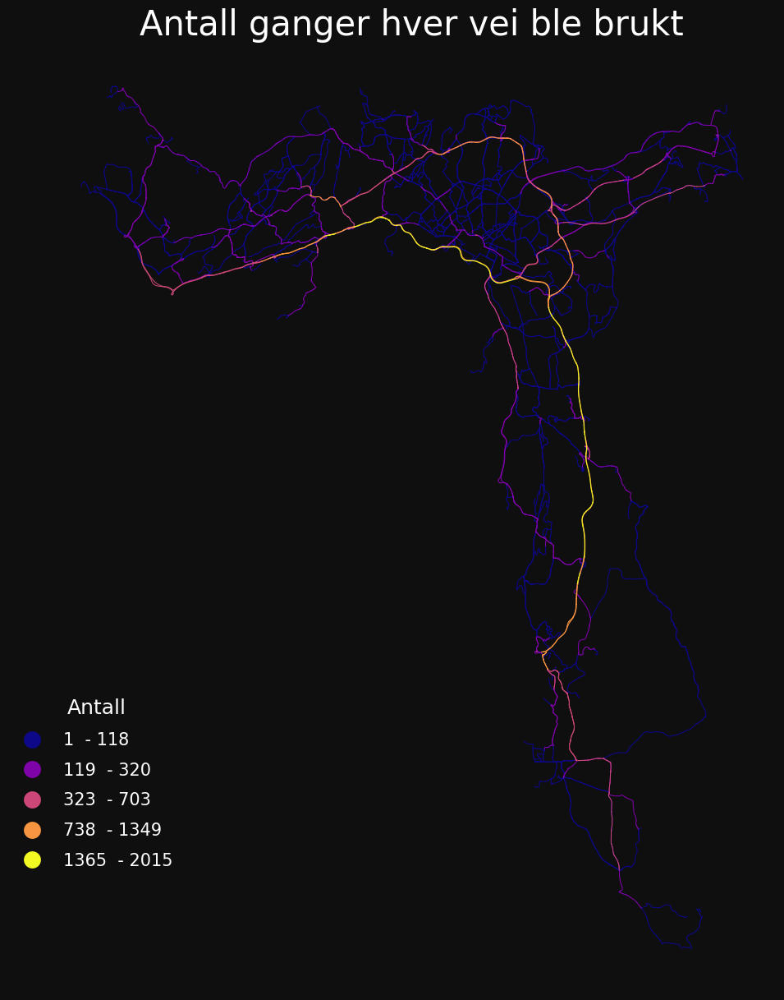

In [20]:
m = sg.ThematicMap(sg.buff(frequencies, 18), column="frequency", size=15)
m.black = True
m.cmap = "plasma" # fargepaletten
m.title = "Antall ganger hver vei ble brukt"
m.legend.title = "Antall"
m.plot()

### Service area

Finner veiene som kan nås innen 1 til 10 minutter fra et tilfeldig bygg. 

In [21]:
service_areas = nwa.service_area(
    punkter.sample(1),
    breaks=np.arange(1, 11),
)

service_areas

,origin,minutes,geometry
0,410,1,MULTILINESTRING Z ((263486.400 6650553.200 30....
1,410,2,MULTILINESTRING Z ((263739.500 6650409.200 34....
2,410,3,MULTILINESTRING Z ((263585.100 6649943.500 30....
3,410,4,MULTILINESTRING Z ((263274.400 6651460.700 57....
4,410,5,MULTILINESTRING Z ((264819.900 6650589.000 92....
5,410,6,MULTILINESTRING Z ((265509.900 6650516.300 88....
6,410,7,MULTILINESTRING Z ((261311.750 6651970.670 81....
7,410,8,MULTILINESTRING Z ((266138.126 6649800.486 100...
8,410,9,MULTILINESTRING Z ((266015.700 6649769.800 98....
9,410,10,MULTILINESTRING Z ((260490.096 6652123.678 73....


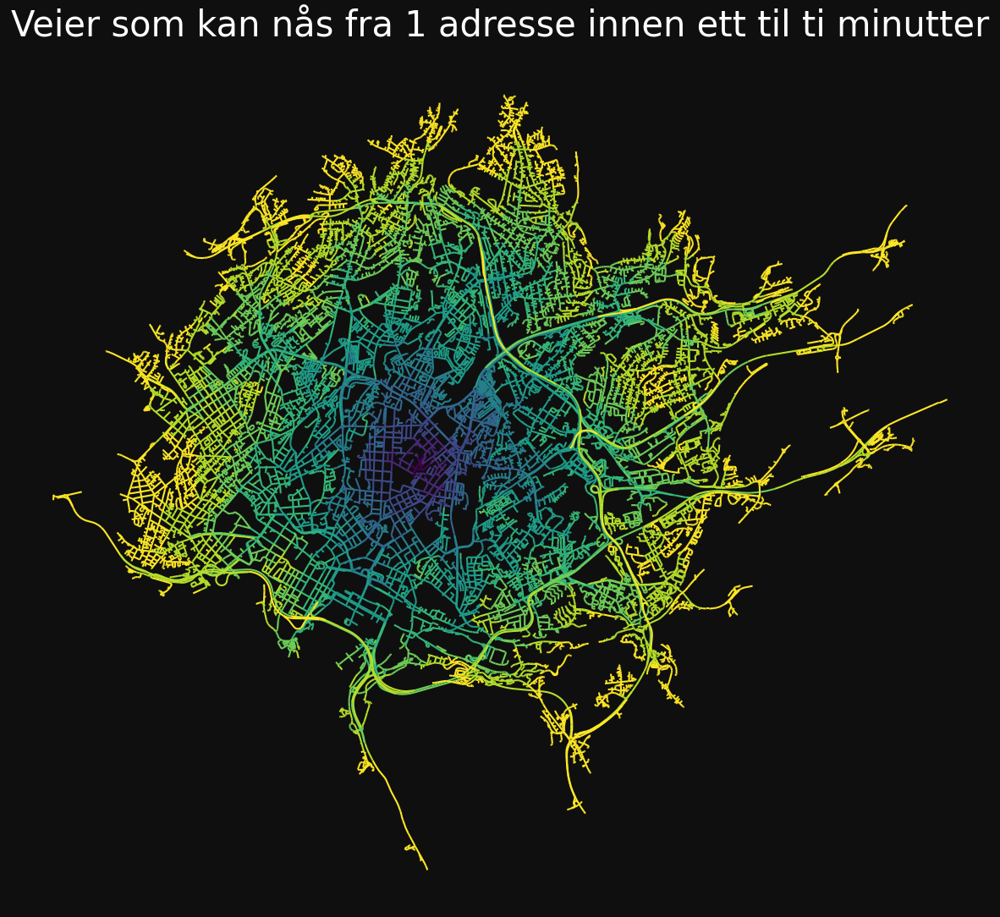

In [22]:
m = sg.ThematicMap(service_areas, column="minutes", size=15)
m.black = True
m.k = 10
m.title = "Veier som kan nås fra 1 adresse innen ett til ti minutter"
m.legend = False
m.plot()

Sjekke loggen:

In [23]:
nwa.log

,endtime,minutes_elapsed,method,origins_count,destinations_count,percent_missing,cost_mean,percent_bidirectional
0,2023-04-27 16:38:27,0.1,get_route,1,1,0.0,6.354152,85
1,2023-04-27 16:38:33,0.1,get_route,1,1,0.0,5.357292,85
2,2023-04-27 16:38:59,0.4,get_route_frequencies,100,100,0.0,0.077217,85
3,2023-04-27 16:39:13,0.1,service_area,1,<NA>,0.0,5.500000,85


### Reisetider: OD Cost Matrix

In [24]:
od = nwa.od_cost_matrix(punkter, punkter)
od

,origin,destination,minutes
0,0,0,0.000000
1,0,1,43.790952
2,0,2,8.617825
3,0,3,22.833675
4,0,4,20.627234
...,...,...,...
999995,999,995,24.840681
999996,999,996,18.027798
999997,999,997,10.167901
999998,999,998,17.535119


Sjekk hvor mange prosent som mangler:

In [25]:
od.minutes.isna().mean() * 100

1.6918

Kolonnene 'origin' og 'destination' bruker index-en til inputene.

Man kan derfor enkelt koble resultatene med start- og sluttpunktene, som her er samme datasett.

In [26]:
joinet = punkter.join(od.set_index("origin"))
joinet

,geometry,destination,minutes
0,POINT (250413.000 6647958.000),0,0.000000
0,POINT (250413.000 6647958.000),1,43.790952
0,POINT (250413.000 6647958.000),2,8.617825
0,POINT (250413.000 6647958.000),3,22.833675
0,POINT (250413.000 6647958.000),4,20.627234
...,...,...,...
999,POINT (267969.000 6646993.000),995,24.840681
999,POINT (267969.000 6646993.000),996,18.027798
999,POINT (267969.000 6646993.000),997,10.167901
999,POINT (267969.000 6646993.000),998,17.535119


Eller koble på aggregert data:

In [27]:
punkter["minutes_mean"] = od.groupby("origin").minutes.mean()
punkter["n_missing"] = len(punkter) - od.groupby("origin", dropna=False).minutes.count()
punkter

,geometry,minutes_mean,n_missing
0,POINT (250413.000 6647958.000),21.929989,8
1,POINT (264422.000 6627053.000),34.069090,8
2,POINT (249640.000 6649555.000),23.425388,8
3,POINT (264841.000 6643427.000),18.088734,8
4,POINT (262748.000 6645269.000),20.902530,8
...,...,...,...
995,POINT (270566.000 6633520.000),29.506202,8
996,POINT (260263.000 6652516.000),18.089527,8
997,POINT (265235.000 6643860.000),18.602159,8
998,POINT (260826.000 6651450.000),16.631968,8


La oss undersøke hvilke punkter som har mye manglende data. 

In [28]:
# gjør kolonnen til tekst for å kunne huke av/på verdiene i explore
punkter["n_missing_cat"] = punkter.n_missing.astype(str)
sg.explore(punkter, column="n_missing_cat")

In [29]:
sg.explore(punkter, column="minutes_mean", scheme="quantiles")

Hvis man vil bruke en kolonne som id-er heller enn index-en, kan man sette index-en inni funksjonen.

Lager en kolonne for cirka

In [31]:
from shapely.geometry import Polygon

koordinater = [
    (10.6923963, 59.9193515),
    (10.7326245, 59.9359748),
    (10.7650605, 59.9505023),
    (10.7760525, 59.9261692),
    (10.780895, 59.9074857),
    (10.7387118, 59.8977548),
]

ca_indre_oslo = sg.to_gdf(Polygon(koordinater), crs=4326).to_crs(25833)
ca_indre_oslo["ca_omraade"] = "indre_oslo"

punkter["ca_omraade"] = (
    punkter.sjoin(ca_indre_oslo, how="left")
    .ca_omraade
    .fillna("ytre_oslo")
)

sg.explore(punkter, ca_indre_oslo, "ca_omraade")

In [32]:
od = nwa.od_cost_matrix(
    punkter.set_index("ca_omraade"),
    punkter,
)

od

,origin,destination,minutes
0,ytre_oslo,0,0.000000
1,ytre_oslo,1,43.790952
2,ytre_oslo,2,8.617825
3,ytre_oslo,3,22.833675
4,ytre_oslo,4,20.627234
...,...,...,...
999995,ytre_oslo,995,24.840681
999996,ytre_oslo,996,18.027798
999997,ytre_oslo,997,10.167901
999998,ytre_oslo,998,17.535119


Så kan man oppsummere for kommunene direkte:

In [33]:
oppsummert_kommunevis = od.groupby("origin").agg(
    minutes_mean=("minutes", "mean"),
    count=("minutes", "count"),
)

oppsummert_kommunevis.index.name = "ca_omraade"
oppsummert_kommunevis.reset_index()

,ca_omraade,minutes_mean,count
0,indre_oslo,16.717911,72416
1,ytre_oslo,22.630309,910666


Med lines=True får man rette linjer, så man lettere kan undersøke resultatene.

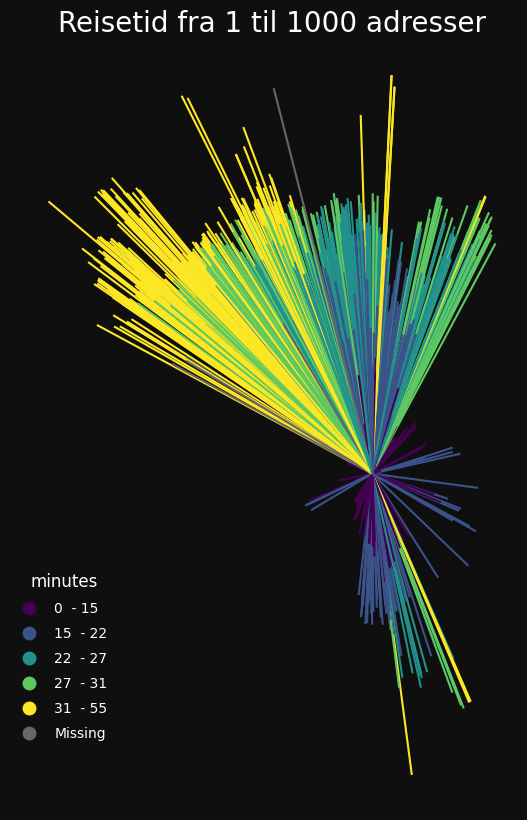

In [34]:
od = nwa.od_cost_matrix(
    punkter.sample(1),
    punkter,
    lines=True
)

m = sg.ThematicMap(od, column="minutes", size=10)
m.black = True
m.title = "Reisetid fra 1 til 1000 adresser"
m.scheme = "quantiles"
m.plot()

## Finn raskeste rute
Velger ett startpunkt for illustrasjons skyld.

In [35]:
routes = nwa.get_route(
    origins=punkter.iloc[[0]],
    destinations=punkter.sample(15),
)

routes

,origin,destination,minutes,geometry
0,0,568,41.680969,MULTILINESTRING Z ((266490.631 6634620.844 149...
1,0,777,21.500081,MULTILINESTRING Z ((256336.500 6649771.200 6.0...
2,0,967,6.513644,MULTILINESTRING Z ((250883.300 6648037.100 15....
3,0,128,38.966178,MULTILINESTRING Z ((264040.736 6643300.860 17....
4,0,136,22.952530,MULTILINESTRING Z ((256336.500 6649771.200 6.0...
5,0,859,31.660645,MULTILINESTRING Z ((265313.448 6649185.915 80....
6,0,825,31.919848,MULTILINESTRING Z ((263875.022 6638558.235 84....
7,0,601,11.196954,MULTILINESTRING Z ((247855.000 6646686.320 83....
8,0,423,10.590057,MULTILINESTRING Z ((246419.678 6651722.001 59....
9,0,490,19.115477,MULTILINESTRING Z ((256336.500 6649771.200 6.0...


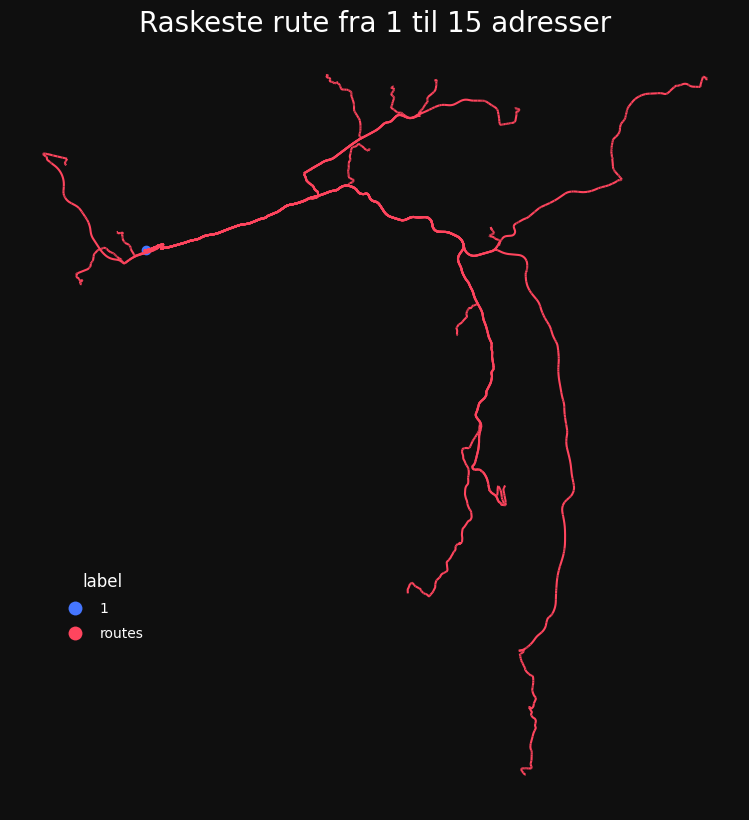

In [38]:
m = sg.ThematicMap(routes, punkter.iloc[[0]], size=10)
m.black = True
m.title = "Raskeste rute fra 1 til 15 adresser"
m.plot()

## Finn raskeste k ruter
k = antall

,origin,destination,minutes,k,geometry
0,2470929,2538349,8.977744,1,MULTILINESTRING Z ((263586.600 6651120.600 47....
1,2470929,2538349,9.019577,2,MULTILINESTRING Z ((263586.600 6651120.600 47....
2,2470929,2538349,10.702815,3,MULTILINESTRING Z ((264335.060 6652126.070 102...
3,2470929,2538349,11.393830,4,MULTILINESTRING Z ((262861.600 6650719.100 23....
4,2470929,2538349,11.659811,5,MULTILINESTRING Z ((263586.600 6651120.600 47....
5,2470929,2538349,12.295612,6,MULTILINESTRING Z ((263586.600 6651120.600 47....
6,2470929,2538349,12.971575,7,MULTILINESTRING Z ((263586.600 6651120.600 47....
7,2470929,2538349,13.700938,8,MULTILINESTRING Z ((263586.600 6651120.600 47....
8,2470929,2538349,13.920801,9,MULTILINESTRING Z ((263586.600 6651120.600 47....
9,2470929,2538349,14.068021,10,MULTILINESTRING Z ((263586.600 6651120.600 47....


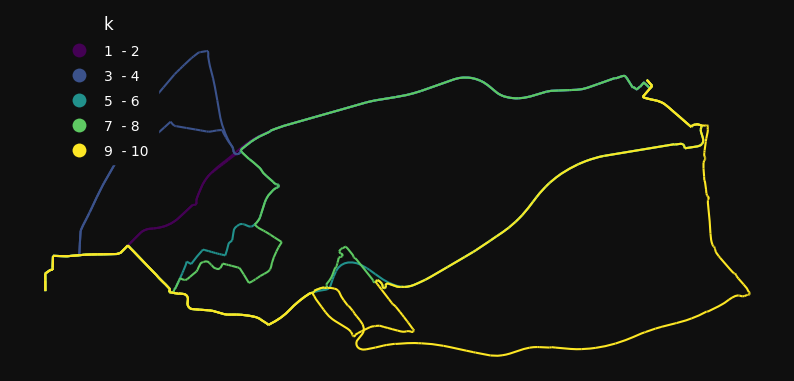

In [39]:
p1, p2 = bygg.loc[[2_470_929]], bygg.loc[[2_538_349]]

k_routes = nwa.get_k_routes(p1, p2, k=10, drop_middle_percent=1)

sg.qtm(k_routes, "k")

k_routes

Men kan stille strengere krav til hvor ulike rutene skal være. 

Med drop_middle_percent=50, fjernes midteste halvdel av ruta fra nettverket (midlertidig) før neste rute skal finnes.

/home/jovyan/arealrek/.venv/lib/python3.10/site-packages/sgis/maps/map.py:223: UserWarning: Could not create 5 classes.
  warnings.warn(f"Could not create {self._k} classes.")


,origin,destination,minutes,k,geometry
0,2470929,2538349,8.977744,1,MULTILINESTRING Z ((263586.600 6651120.600 47....
1,2470929,2538349,12.295612,2,MULTILINESTRING Z ((263586.600 6651120.600 47....
2,2470929,2538349,15.386203,3,MULTILINESTRING Z ((263586.600 6651120.600 47....
3,2470929,2538349,17.419792,4,MULTILINESTRING Z ((263586.600 6651120.600 47....
4,2470929,2538349,19.936433,5,MULTILINESTRING Z ((266960.510 6651263.890 116...
5,2470929,2538349,25.519504,6,MULTILINESTRING Z ((269773.300 6651532.900 122...


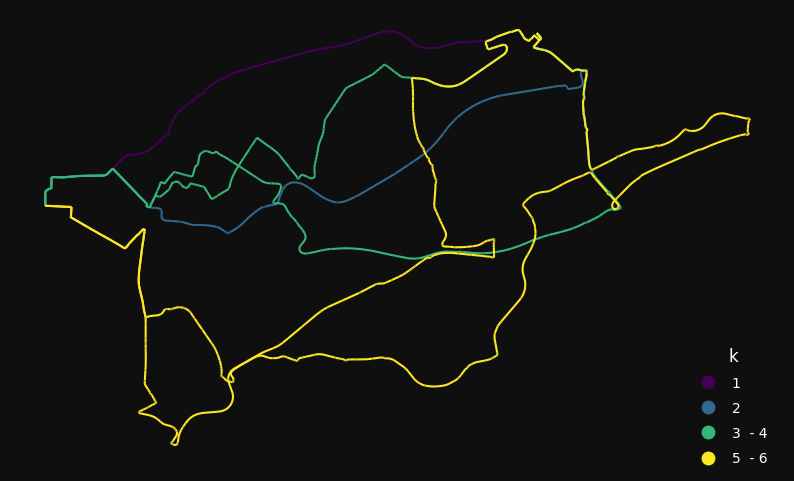

In [40]:
k_routes = nwa.get_k_routes(p1, p2, k=10, drop_middle_percent=50)

sg.qtm(k_routes, "k")

k_routes

Her fant man bare seks ulike ruter. Med drop_middle_percent=100, finner man bare én rute:

,origin,destination,minutes,k,geometry
0,2470929,2538349,8.977744,1,MULTILINESTRING Z ((263586.600 6651120.600 47....


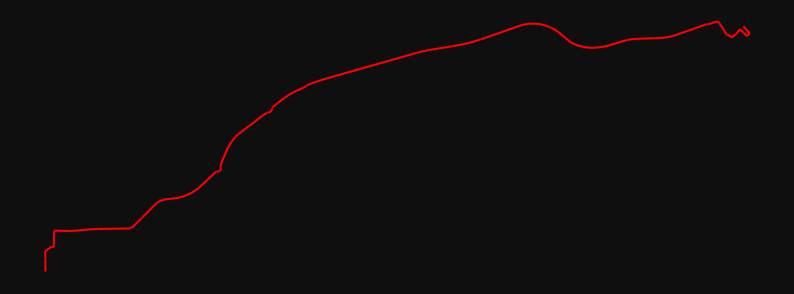

In [41]:
k_routes = nwa.get_k_routes(p1, p2, k=10, drop_middle_percent=100)

sg.qtm(k_routes, "k", color="red")

k_routes